## 2 - Export Data Assessment (Gaze)

##### Imports

In [1]:
import os
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading

In [2]:
# Load ddfs into dictionary (exception for 'all_surf_pos', df)
root_dir = './aggregated_data'
def load_data(root_dir, exception=False):    # Get csv file reads into one dictionary
    data = {}
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            file_name = os.path.splitext(file)[0]   #file name without '.csv'
            if file.endswith('.csv') and file != 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = dd.read_csv(file_path)    #read and attach to dict
            elif exception and file == 'all_surf_positions_HiDrive_Studie2.csv':
                data [file_name] = pd.read_csv(file_path, converters=converters)    #read as normal and attach to dict
    return data
def parse(filedata): # Manually read the column
    output = []
    for line in filedata.split('\n'): # split into lines
        line = line.strip().rstrip(']').lstrip('[') #remove whitespace and brackets
        if not line:  
            continue    #skip empty lines
        line = line.split() #split into cell
        row = []
        for cell in line:
            cell = cell.strip()     #remove whitespace
            if not cell.strip():
                continue    #skip empty cells
            row.append(float(cell)) #convert to float and add
        output.append(row)
    return output
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
    "dist_img_to_surf_trans": parse,
    "surf_to_dist_img_trans": parse,
}

data = load_data(root_dir)

In [3]:
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
columns = ['participant_id', 'gaze_timestamp', 'world_index', 'confidence', 'norm_pos_x', 'norm_pos_y', 'base_data']
ddf = data['all_gaze_positions'].loc[:, columns]
df = ddf.compute()

### 1. Inspection
Head & Tail,  Basic statistics,  Missing values

##### Head & tail

In [4]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].head())
    display(participant_df.iloc[:, 1:].tail())

'Participant 1'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
0,-672842.714933,0,1.0,0.297494,0.619428
1,-672842.710916,0,1.0,0.297249,0.618158
2,-672842.707012,0,1.0,0.299522,0.617206
3,-672842.705091,0,1.0,0.299876,0.614482
4,-672842.701116,0,1.0,0.300466,0.614856


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
14603,-668799.326114,116961,0.987346,0.430986,0.376699
14604,-668799.322119,116962,1.000000,0.431303,0.375209
14605,-668799.318110,116962,1.000000,0.432926,0.376336
14606,-668799.314122,116962,1.000000,0.432727,0.378719
14607,-668799.310125,116962,1.000000,0.433850,0.379007


'Participant 2'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
14608,-664549.391037,0,0.889999,0.362097,0.575381
14609,-664549.387041,0,0.889999,0.361649,0.573662
14610,-664549.383041,0,0.905976,0.362137,0.575123
14611,-664549.379014,0,0.905976,0.362458,0.574585
14612,-664549.374990,0,0.995018,0.362425,0.576448


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
116677,-661485.336262,90023,0.918920,0.597053,0.250385
116678,-661485.332276,90024,0.918920,0.596911,0.250106
116679,-661485.328281,90024,0.946103,0.594085,0.246779
116680,-661485.324244,90024,0.946103,0.587804,0.255053
116681,-661485.320214,90024,0.995000,0.571735,0.249696


'Participant 4'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
116682,-587761.670096,0,0.933501,0.610447,0.749405
116683,-587761.666092,0,0.933501,0.609615,0.748942
116684,-587761.662128,0,0.933501,0.609389,0.751314
116685,-587761.658127,0,0.967228,0.608609,0.750710
116686,-587761.654111,0,0.967228,0.609491,0.749307


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
67403,-584619.488604,81083,0.696839,0.545780,0.078680
67404,-584619.482248,81084,0.494414,0.520199,0.154506
67405,-584619.478855,81084,0.696839,0.545803,0.078246
67406,-584619.475645,81084,0.699027,0.546775,0.074892
67407,-584619.471394,81084,0.452685,0.444138,0.116438


'Participant 5'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
67408,-578913.038469,0,0.960255,0.378191,0.527964
67409,-578913.034458,0,0.998395,0.378544,0.527229
67410,-578913.030472,0,1.000000,0.379850,0.522809
67411,-578913.026501,0,1.000000,0.380438,0.522511
67412,-578913.022523,0,1.000000,0.381291,0.522755


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
156080,-575204.197790,100853,1.0,0.669059,0.227271
156081,-575204.193837,100853,1.0,0.670391,0.228677
156082,-575204.189883,100853,1.0,0.670919,0.227538
156083,-575204.185893,100853,1.0,0.672452,0.228692
156084,-575204.181937,100853,1.0,0.673847,0.229795


'Participant 6'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
156085,82162.229214,0,0.863634,0.356272,0.531403
156086,82162.233189,0,0.863634,0.358264,0.532211
156087,82162.237206,0,0.946239,0.359230,0.530728
156088,82162.241238,0,0.946239,0.360008,0.530141
156089,82162.245240,0,0.965760,0.359949,0.536026


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
128442,85415.409344,96775,1.000000,0.494654,0.389523
128443,85415.413311,96776,1.000000,0.494102,0.390763
128444,85415.417316,96776,1.000000,0.494623,0.391654
128445,85415.421318,96776,0.986736,0.494544,0.392465
128446,85415.425337,96776,1.000000,0.494789,0.392859


'Participant 7'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
128447,349980.581230,0,1.000000,0.348302,0.763595
128448,349980.585223,0,0.993424,0.348203,0.763431
128449,349980.589260,0,0.993424,0.348575,0.763548
128450,349980.593278,0,0.998362,0.348589,0.763079
128451,349980.597250,0,0.998362,0.348074,0.762857


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
90653,353175.964217,95269,1.0,0.634998,0.883597
90654,353175.968228,95270,1.0,0.633841,0.884106
90655,353175.972270,95270,1.0,0.631588,0.884725
90656,353175.976294,95270,1.0,0.626852,0.888197
90657,353175.980309,95270,1.0,0.623448,0.889698


'Participant 8'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
90658,4131.595311,0,0.990,0.678818,0.525309
90659,4131.599975,0,0.990,0.687797,0.545040
90660,4131.605059,0,0.990,0.692228,0.564763
90661,4131.610157,0,0.990,0.701822,0.596796
90662,4131.612611,0,0.995,0.706112,0.613076


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
25617,7344.891944,95837,0.876848,0.751596,0.595276
25618,7344.895953,95837,0.876848,0.751874,0.596047
25619,7344.897969,95837,1.000000,0.662176,0.434165
25620,7344.901936,95837,0.255640,1.072500,0.787379
25621,7344.905933,95837,1.000000,0.660849,0.435841


'Participant 9'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
25622,22196.698465,0,1.0,0.690598,0.755619
25623,22196.702989,0,1.0,0.689260,0.755205
25624,22196.705476,0,1.0,0.688226,0.754459
25625,22196.708942,0,1.0,0.685487,0.750619
25626,22196.712974,0,1.0,0.683859,0.752393


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
158891,25449.586393,97013,1.0,0.638955,0.582896
158892,25449.590350,97014,1.0,0.638491,0.582361
158893,25449.594306,97014,1.0,0.638566,0.582315
158894,25449.598352,97014,1.0,0.637466,0.582408
158895,25449.602372,97014,1.0,0.636687,0.579944


'Participant 10'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
158896,5423.374679,0,0.955904,0.778815,0.544551
158897,5423.378685,0,0.923861,0.778314,0.545355
158898,5423.382674,0,0.923861,0.779842,0.544985
158899,5423.386669,0,0.923861,0.779253,0.547942
158900,5423.390617,0,0.917059,0.780744,0.547445


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
141625,8724.187648,98430,0.851213,0.527896,0.797582
141626,8724.191636,98430,0.851213,0.497718,0.814531
141627,8724.197586,98431,0.425019,0.472485,-0.487563
141628,8724.205598,98431,0.422270,0.472276,-0.479781
141629,8724.213606,98431,0.328320,0.449801,-0.449798


'Participant 11'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
141630,16541.757294,0,1.0,0.538091,0.780993
141631,16541.761315,0,1.0,0.537373,0.781244
141632,16541.765285,0,1.0,0.537048,0.781744
141633,16541.769249,0,1.0,0.535971,0.783030
141634,16541.773257,0,1.0,0.536097,0.782706


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
114104,19781.537210,96620,1.000000,0.486781,0.918465
114105,19781.540347,96621,1.000000,0.488226,0.917514
114106,19781.544372,96621,0.998022,0.490239,0.917435
114107,19781.548349,96621,0.998022,0.491051,0.916789
114108,19781.552340,96621,1.000000,0.490240,0.915682


'Participant 12'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
114109,84203.906368,0,0.000000,0.832730,0.051354
114110,84203.914369,0,0.799557,0.480136,0.433889
114111,84203.914393,0,0.000000,0.832730,0.051354
114112,84203.918348,0,0.824073,0.481467,0.429798
114113,84203.922362,0,0.811107,0.482642,0.427160


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
84275,87442.085972,96568,1.0,0.454086,0.503055
84276,87442.089935,96569,1.0,0.452817,0.507382
84277,87442.093967,96569,1.0,0.451077,0.507240
84278,87442.097978,96569,1.0,0.450377,0.511584
84279,87442.102005,96569,1.0,0.451749,0.513402


'Participant 13'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
84280,93626.214896,0,1.000000,0.500170,0.465839
84281,93626.220909,0,0.947864,0.499047,0.465868
84282,93626.224897,0,0.947864,0.498796,0.465425
84283,93626.228935,0,1.000000,0.498927,0.467913
84284,93626.232894,0,1.000000,0.498875,0.467630


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
157194,97300.510667,109565,1.0,0.459424,0.575338
157195,97300.514638,109566,1.0,0.459737,0.574954
157196,97300.518659,109566,1.0,0.461452,0.576122
157197,97300.522668,109566,1.0,0.461452,0.576932
157198,97300.526653,109566,1.0,0.461098,0.577135


'Participant 14'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
157199,99784.675784,0,1.0,0.530694,0.510267
157200,99784.679789,0,1.0,0.530245,0.511415
157201,99784.683797,0,1.0,0.530396,0.512211
157202,99784.687820,0,1.0,0.531751,0.510794
157203,99784.691835,0,1.0,0.531714,0.509750


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
18851,103247.131447,103240,1.0,0.466953,0.753386
18852,103247.135445,103241,1.0,0.467170,0.752118
18853,103247.139443,103241,1.0,0.465715,0.752813
18854,103247.143431,103241,1.0,0.465765,0.751959
18855,103247.147433,103241,1.0,0.465766,0.750982


'Participant 15'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
18856,3148.490381,0,0.894628,0.359488,0.537494
18857,3148.494379,0,0.905866,0.359701,0.537866
18858,3148.498346,0,0.905866,0.359605,0.538092
18859,3148.502413,0,0.953558,0.359712,0.538047
18860,3148.506454,0,0.953558,0.359386,0.537991


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
1816,6444.406045,98273,1.000000,0.533982,0.496573
1817,6444.410085,98274,1.000000,0.534987,0.494797
1818,6444.414114,98274,1.000000,0.535334,0.495963
1819,6444.418129,98274,1.000000,0.535459,0.497237
1820,6444.422132,98274,0.972863,0.536296,0.497331


'Participant 16'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
1821,87725.770149,0,1.0,0.502992,0.505903
1822,87725.774152,0,1.0,0.501457,0.508038
1823,87725.778178,0,1.0,0.500717,0.507800
1824,87725.782135,0,1.0,0.499751,0.506352
1825,87725.786147,0,1.0,0.499513,0.508124


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
92726,91478.736597,111915,0.954019,0.425390,0.683098
92727,91478.740608,111916,0.954019,0.427034,0.681730
92728,91478.744623,111916,1.000000,0.432814,0.670283
92729,91478.748600,111916,1.000000,0.440831,0.663917
92730,91478.752615,111916,0.995000,0.455097,0.628003


'Participant 17'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
92731,2660.048997,0,1.0,0.476952,0.504720
92732,2660.054975,0,1.0,0.476906,0.505528
92733,2660.058956,0,1.0,0.476826,0.504717
92734,2660.062952,0,1.0,0.476840,0.503968
92735,2660.066983,0,1.0,0.476763,0.505383


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
70389,5894.517587,96392,0.899776,0.565612,0.311391
70390,5894.521583,96392,0.899776,0.565695,0.312143
70391,5894.525922,96392,0.964021,0.565580,0.312885
70392,5894.529897,96392,0.964021,0.565485,0.312016
70393,5894.533536,96392,0.946427,0.565331,0.311596


'Participant 18'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
70394,4063.066743,0,1.0,0.706975,0.584683
70395,4063.070747,0,1.0,0.707226,0.583964
70396,4063.074781,0,1.0,0.707955,0.584198
70397,4063.078847,0,1.0,0.708539,0.584232
70398,4063.082845,0,1.0,0.708016,0.583733


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
129811,7661.647005,107249,1.0,0.871036,0.549652
129812,7661.651027,107250,1.0,0.871332,0.549651
129813,7661.655069,107250,1.0,0.872130,0.550116
129814,7661.659068,107250,1.0,0.872031,0.549156
129815,7661.663037,107250,1.0,0.872419,0.548638


'Participant 19'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
129816,71588.542259,0,0.965080,0.384319,0.370203
129817,71588.546295,0,0.953547,0.380698,0.376746
129818,71588.550278,0,0.953547,0.374264,0.375353
129819,71588.554255,0,0.995000,0.369295,0.393051
129820,71588.558753,0,0.995000,0.364277,0.395797


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
131405,74959.671517,100470,0.670933,0.415621,0.004272
131406,74959.675497,100471,0.724708,0.413839,0.003334
131407,74959.679014,100471,0.724708,0.413904,0.003194
131408,74959.683027,100471,0.690338,0.413551,0.003864
131409,74959.686751,100471,0.690338,0.414240,-0.003334


'Participant 20'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
131410,80485.639636,0,1.0,0.447946,0.511940
131411,80485.643617,0,1.0,0.448001,0.510230
131412,80485.647613,0,1.0,0.447694,0.508546
131413,80485.651585,0,1.0,0.450152,0.510443
131414,80485.655646,0,1.0,0.450575,0.510615


,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
166738,83997.372152,104720,1.000000,0.443040,0.072722
166739,83997.376056,104720,0.351623,0.478095,0.080021
166740,83997.384082,104720,0.342603,0.477897,0.078992
166741,83997.392306,104721,0.317278,0.477676,0.077950
166742,83997.400038,104721,0.315202,0.495744,0.057440


##### Basic statistics
- P08 low confidence
- Bounds for norm_pos -> (-100, +100)

In [5]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 1'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,1.000351e+06,1.000351e+06,1.000351e+06,1.000351e+06,1.000351e+06
mean,-6.708210e+05,5.797953e+04,9.874743e-01,5.024607e-01,5.306712e-01
std,1.167275e+03,3.365911e+04,8.175110e-02,8.635828e-02,1.695136e-01
min,-6.728427e+05,0.000000e+00,0.000000e+00,-7.549137e+00,-5.415960e+01
25%,-6.718320e+05,2.888500e+04,1.000000e+00,4.623665e-01,4.575119e-01
50%,-6.708209e+05,5.777100e+04,1.000000e+00,5.036744e-01,5.579436e-01
75%,-6.698099e+05,8.683000e+04,1.000000e+00,5.450693e-01,6.224659e-01
max,-6.687993e+05,1.169620e+05,1.000000e+00,1.257636e+01,3.117053e+01


'Participant 2'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,758055.000000,758055.000000,758055.000000,758055.000000,758055.000000
mean,-663017.352978,45030.559397,0.938595,0.466324,0.450627
std,884.469434,25958.196576,0.143638,0.097985,0.227656
min,-664549.391037,0.000000,0.000000,-20.893575,-100.000000
25%,-663783.276836,22588.000000,0.932932,0.425625,0.366293
50%,-663017.418629,45078.000000,0.996529,0.470932,0.445514
75%,-662251.296396,67444.000000,1.000000,0.508065,0.538063
max,-661485.320214,90024.000000,1.000000,13.773589,34.290298


'Participant 4'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,762752.000000,762752.000000,762752.000000,762752.000000,762752.000000
mean,-586191.830632,40661.818470,0.931726,0.491961,0.673421
std,907.698620,23231.517333,0.146180,0.281095,0.454088
min,-587761.670096,0.000000,0.000000,-24.176385,-100.000000
25%,-586978.152911,20681.000000,0.936720,0.426848,0.601277
50%,-586193.401737,40754.000000,0.968864,0.489209,0.707583
75%,-585404.224619,60645.000000,0.993344,0.540325,0.769990
max,-584619.471394,81084.000000,1.000000,100.000000,53.456297


'Participant 5'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,913029.000000,913029.000000,913029.000000,913029.000000,913029.000000
mean,-577058.858322,50170.476977,0.971981,0.494240,0.732765
std,1070.767312,29050.222067,0.129709,0.089649,0.207170
min,-578913.038469,0.000000,0.000000,-4.865042,-100.000000
25%,-577986.204251,24945.000000,1.000000,0.450639,0.652552
50%,-577058.916086,50187.000000,1.000000,0.494351,0.756271
75%,-576131.606104,75240.000000,1.000000,0.538586,0.849783
max,-575204.181937,100853.000000,1.000000,26.249558,26.168751


'Participant 6'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,805977.000000,805977.000000,805977.000000,805977.000000,805977.000000
mean,83788.784004,48415.041994,0.988929,0.495725,0.664542
std,939.126624,27934.285461,0.078399,0.126520,0.138398
min,82162.229214,0.000000,0.000000,-2.269602,-100.000000
25%,82975.460887,24227.000000,1.000000,0.477840,0.635435
50%,83788.740265,48438.000000,1.000000,0.498634,0.673166
75%,84602.114247,72622.000000,1.000000,0.520700,0.702983
max,85415.425337,96776.000000,1.000000,100.000000,2.581326


'Participant 7'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,790892.000000,790892.000000,790892.000000,790892.000000,790892.000000
mean,351578.415004,47634.236379,0.958710,0.520777,0.669407
std,922.181417,27501.737681,0.128762,0.368025,0.419043
min,349980.581230,0.000000,0.000000,-25.947639,-100.000000
25%,350779.923945,23822.000000,0.985644,0.463375,0.569654
50%,351578.317545,47637.000000,1.000000,0.522561,0.699468
75%,352376.967469,71442.000000,1.000000,0.581403,0.781245
max,353175.980309,95270.000000,1.000000,100.000000,48.411091


'Participant 8'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,793691.000000,793691.000000,793691.000000,793691.000000,793691.000000
mean,5738.424867,47912.052018,0.873352,0.521112,0.431499
std,928.021765,27683.860158,0.220686,0.534784,0.660504
min,4131.595311,0.000000,0.000000,-26.132821,-100.000000
25%,4934.578541,23931.000000,0.867893,0.435868,0.312887
50%,5738.408331,47911.000000,0.975114,0.509512,0.488983
75%,6542.658167,71902.000000,1.000000,0.588949,0.579402
max,7344.905933,95837.000000,1.000000,100.000000,63.570757


'Participant 9'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,803341.000000,803341.000000,803341.000000,803341.000000,803341.000000
mean,23823.009523,48498.983189,0.983979,0.517706,0.517798
std,939.017317,28005.121001,0.093962,0.243091,0.345232
min,22196.698465,0.000000,0.000000,-21.592345,-100.000000
25%,23009.856801,24249.000000,1.000000,0.465998,0.442648
50%,23822.718676,48484.000000,1.000000,0.513709,0.557188
75%,24636.241898,72751.000000,1.000000,0.577365,0.610257
max,25449.602372,97014.000000,1.000000,100.000000,47.339782


'Participant 10'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,816091.000000,816091.000000,816091.000000,816091.000000,816091.000000
mean,7073.599282,49205.661065,0.973132,0.490177,0.623904
std,952.851641,28415.801085,0.120997,0.168145,0.232122
min,5423.374679,0.000000,0.000000,-12.305722,-100.000000
25%,6248.350369,24594.000000,1.000000,0.427541,0.543261
50%,7073.516122,49202.000000,1.000000,0.490924,0.648777
75%,7898.837822,73819.000000,1.000000,0.548858,0.731948
max,8724.213606,98431.000000,1.000000,100.000000,21.348646


'Participant 11'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,801448.000000,801448.000000,801448.000000,801448.000000,801448.000000
mean,18161.487330,48308.229448,0.987253,0.494221,0.805173
std,935.324082,27894.484608,0.077792,0.235389,0.209197
min,16541.757294,0.000000,0.000000,-20.429026,-100.000000
25%,17351.450087,24150.000000,1.000000,0.440186,0.730810
50%,18161.268809,48304.000000,1.000000,0.494979,0.823383
75%,18971.424715,72466.250000,1.000000,0.549635,0.899440
max,19781.552340,96621.000000,1.000000,100.000000,56.252056


'Participant 12'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,801744.000000,801744.000000,801744.000000,801744.000000,801744.000000
mean,85823.086478,48275.220787,0.967848,0.475091,0.669067
std,934.677528,27880.696454,0.138605,0.283489,0.378139
min,84203.906368,0.000000,0.000000,-22.496887,-100.000000
25%,85013.772734,24134.000000,1.000000,0.427398,0.604879
50%,85823.081150,48269.000000,1.000000,0.470676,0.691817
75%,86632.411405,72416.000000,1.000000,0.516961,0.756143
max,87442.102005,96569.000000,1.000000,100.000000,44.729807


'Participant 13'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,907833.000000,907833.000000,907833.000000,907833.000000,907833.000000
mean,95463.059400,54755.600136,0.981960,0.517320,0.541523
std,1060.882078,31641.646365,0.086386,0.102697,0.263012
min,93626.214896,0.000000,0.000000,-16.032513,-53.678110
25%,94544.211345,27353.000000,1.000000,0.471908,0.427158
50%,95462.791747,54748.000000,1.000000,0.516007,0.561475
75%,96381.852228,82160.000000,1.000000,0.566912,0.706854
max,97300.526653,109566.000000,1.000000,19.679466,31.787511


'Participant 14'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,857561.000000,857561.00000,857561.000000,857561.000000,857561.000000
mean,101515.793597,51618.36125,0.983934,0.505456,0.712084
std,999.563213,29808.13267,0.091889,0.175704,0.178623
min,99784.675784,0.00000,0.000000,-22.638719,-100.000000
25%,100650.148236,25798.00000,1.000000,0.466825,0.665814
50%,101515.684338,51620.00000,1.000000,0.499223,0.726338
75%,102381.482713,77434.00000,1.000000,0.541102,0.778259
max,103247.147433,103241.00000,1.000000,100.000000,47.887344


'Participant 15'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,814824.000000,814824.000000,814824.000000,814824.000000,814824.000000
mean,4796.365788,49125.418908,0.924865,0.462710,0.577746
std,951.300218,28372.331551,0.184656,0.409564,0.567093
min,3148.490381,0.000000,0.000000,-25.280349,-100.000000
25%,3972.493860,24552.000000,0.933869,0.404098,0.450953
50%,4796.302059,49123.000000,0.994954,0.461676,0.596562
75%,5620.076719,73692.000000,1.000000,0.517702,0.708577
max,6444.422132,98274.000000,1.000000,100.000000,64.727913


'Participant 16'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,928474.000000,928474.000000,928474.000000,928474.000000,928474.000000
mean,89601.984338,55945.548096,0.961817,0.491104,0.716128
std,1083.534147,32321.574046,0.158356,0.498538,0.640164
min,87725.770149,0.000000,0.000000,-26.969181,-100.000000
25%,88663.417198,27944.000000,1.000000,0.424828,0.641790
50%,89601.978349,55944.000000,1.000000,0.482394,0.731318
75%,90540.255534,83937.000000,1.000000,0.544947,0.810393
max,91478.752615,111916.000000,1.000000,100.000000,64.523403


'Participant 17'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,801298.000000,801298.000000,801298.000000,801298.000000,801298.000000
mean,4277.201937,48174.460732,0.984851,0.504521,0.519436
std,933.751367,27835.702263,0.051649,0.089050,0.146657
min,2660.048997,0.000000,0.000000,-4.539324,-38.356391
25%,3468.496087,24072.000000,0.990000,0.455791,0.407091
50%,4277.105268,48173.000000,1.000000,0.496057,0.556382
75%,5085.940377,72282.750000,1.000000,0.548781,0.634669
max,5894.533536,96392.000000,1.000000,3.069509,8.765488


'Participant 18'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,890179.000000,890179.000000,890179.000000,890179.000000,890179.000000
mean,5861.825709,53602.407101,0.981245,0.497350,0.489098
std,1038.758040,30967.638325,0.106461,0.293055,0.384667
min,4063.066743,0.000000,0.000000,-15.353826,-100.000000
25%,4962.368847,26778.000000,1.000000,0.427072,0.378793
50%,5861.568965,53599.000000,1.000000,0.484343,0.504885
75%,6761.283009,80417.000000,1.000000,0.559459,0.607152
max,7661.663037,107250.000000,1.000000,100.000000,38.487294


'Participant 19'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,834038.000000,834038.000000,834038.000000,834038.000000,834038.000000
mean,73273.809495,50230.241687,0.980783,0.494204,0.544985
std,973.143663,29011.271110,0.091247,0.185045,0.234175
min,71588.542259,0.000000,0.000000,-12.805860,-100.000000
25%,72430.905387,25103.000000,1.000000,0.454711,0.490862
50%,73273.854966,50232.000000,1.000000,0.501358,0.560304
75%,74116.454248,75348.750000,1.000000,0.551301,0.621163
max,74959.686751,100471.000000,1.000000,100.000000,64.637059


'Participant 20'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
count,868990.000000,868990.000000,868990.000000,868990.000000,868990.000000
mean,82241.463394,52359.039866,0.984096,0.479554,0.636463
std,1013.802841,30233.528909,0.091782,0.188292,0.182351
min,80485.639636,0.000000,0.000000,-17.179548,-56.949701
25%,81363.396743,26173.250000,1.000000,0.419904,0.560789
50%,82241.503763,52358.000000,1.000000,0.482345,0.657682
75%,83119.489255,78541.000000,1.000000,0.546267,0.732250
max,83997.400038,104721.000000,1.000000,87.896439,29.739363


##### Missing values
- No missing values

In [6]:
def missing_values(df):     # Compute missing values (count, pct and location)
    missing_data = df.isnull().sum()
    missing_percentage = ((missing_data / len(df)) * 100).apply(lambda x: f"{x:.2f}")
    missing_positions = df.apply(lambda x: ', '.join(str(idx) for idx in x.index[x.isnull()]), axis=0)
    
    missing_df = pd.DataFrame({     #create df to display
        'null_count': missing_data,
        'null_pct': missing_percentage,
        'location': missing_positions
    }).transpose()  # Transpose to have columns as indexes and new parameters as row indexes
    
    return missing_df

In [7]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(missing_values(participant_df.iloc[:, 1:]))

'Participant 1'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 2'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 4'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 5'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 6'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 7'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 8'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 9'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 10'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 11'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 12'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 13'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 14'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 15'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 16'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 17'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 18'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 19'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


'Participant 20'

,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y
null_count,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00
location,,,,,


### 2. Quality Assessment
Confidence, Normalized position, Spatial distributions +correlations +boxplots

##### Confidence distribution
- Good

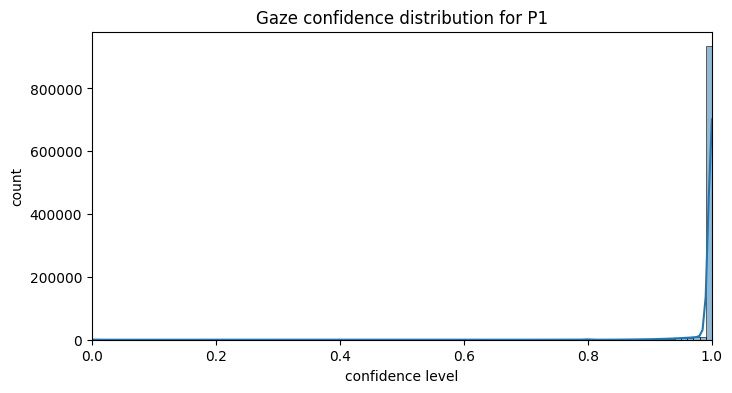

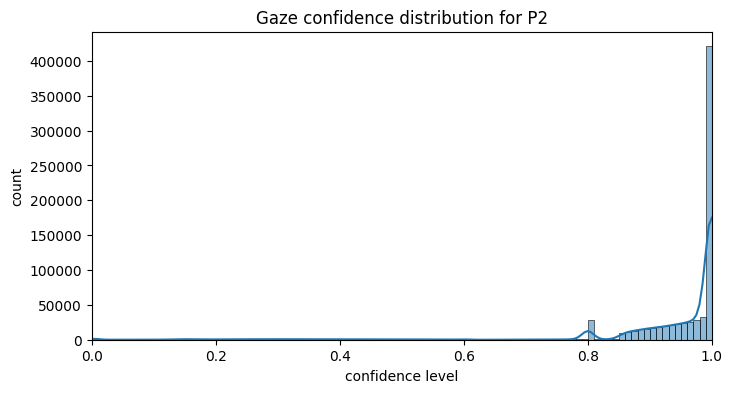

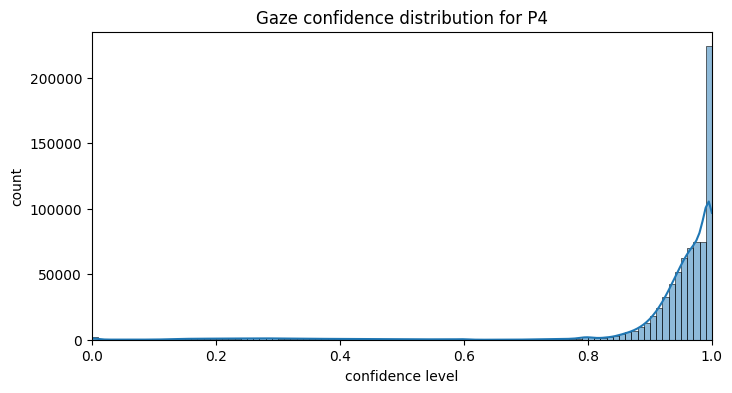

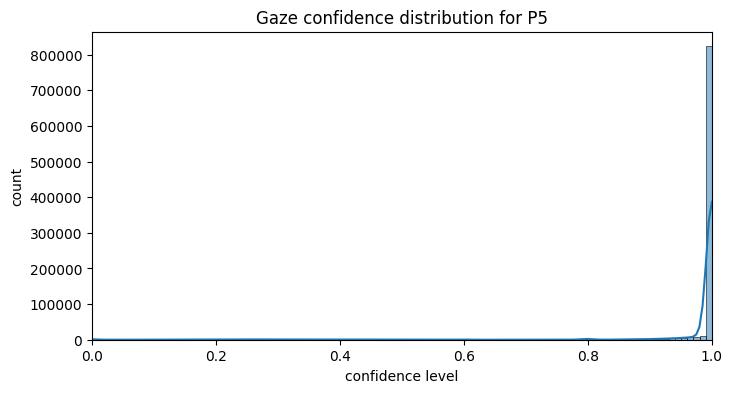

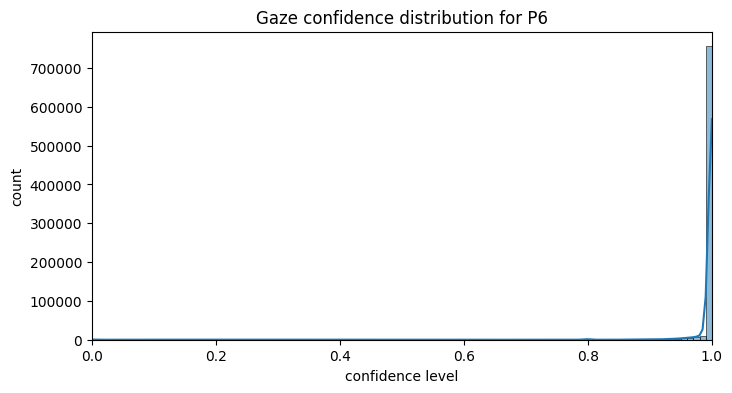

...

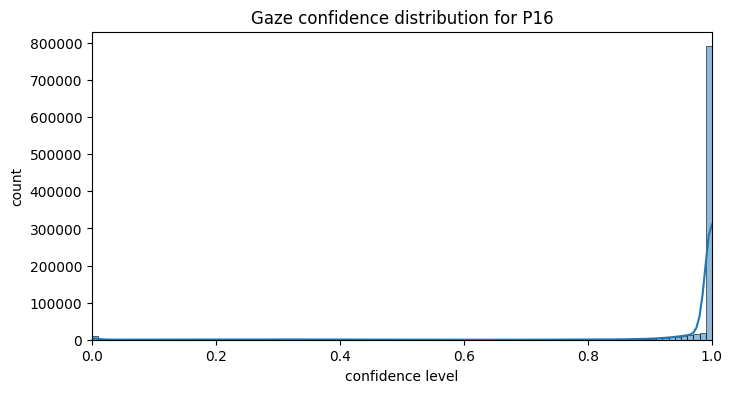

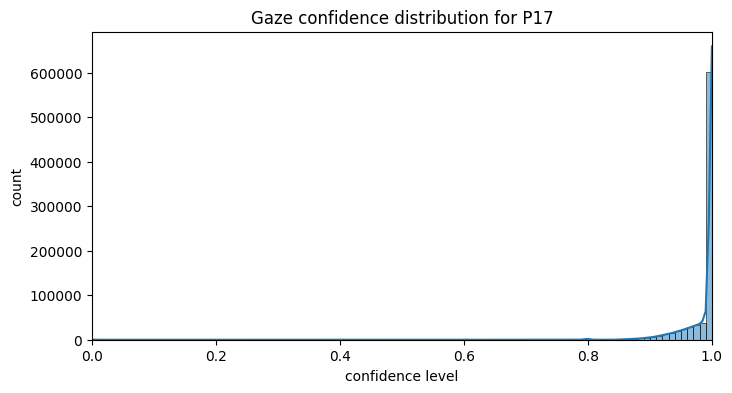

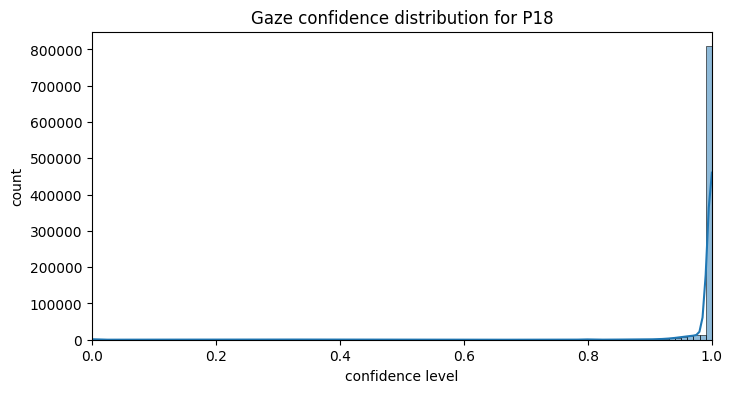

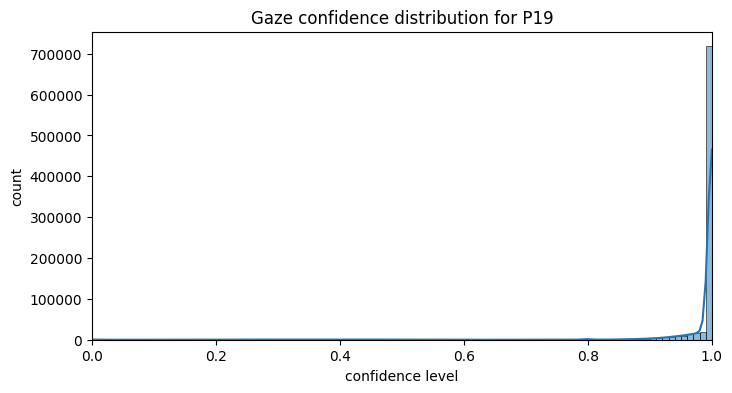

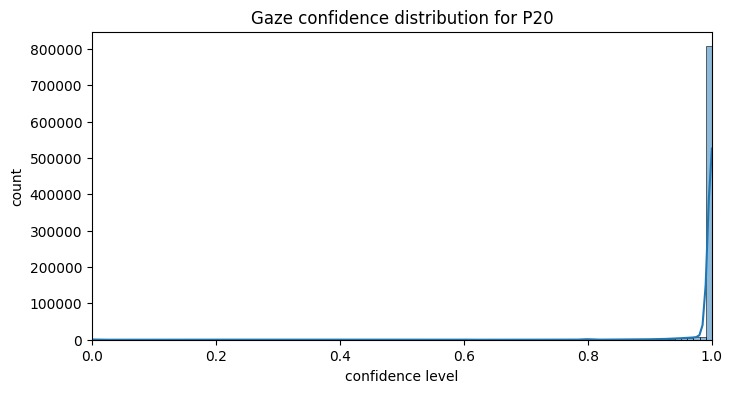

In [8]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['confidence'], bins=100, kde=True)
    plt.title(f'Gaze confidence distribution for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('count')
    plt.xlim(0,1)
    plt.show()

##### Normalized x-y position distribution
- Good

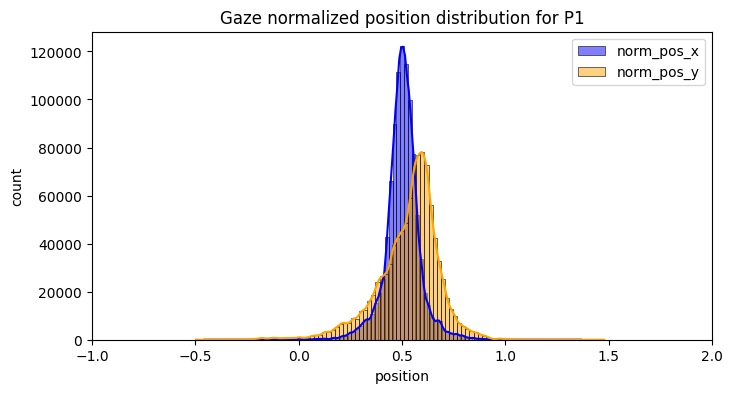

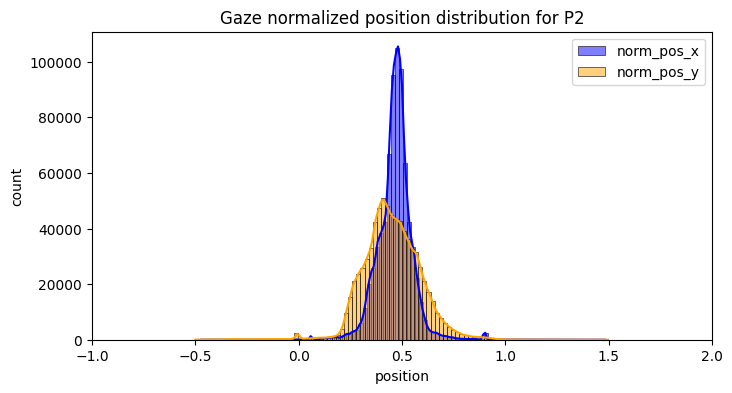

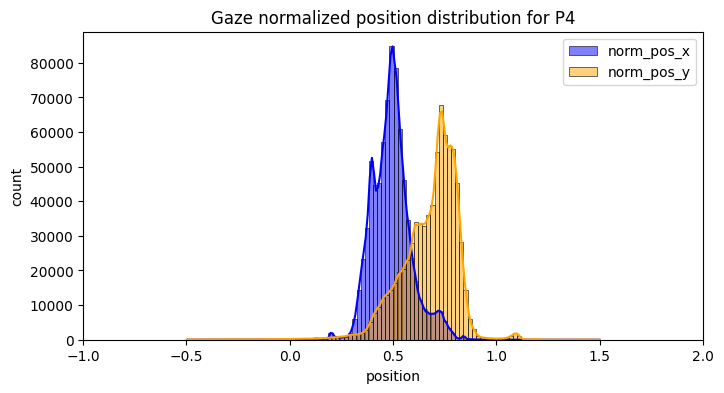

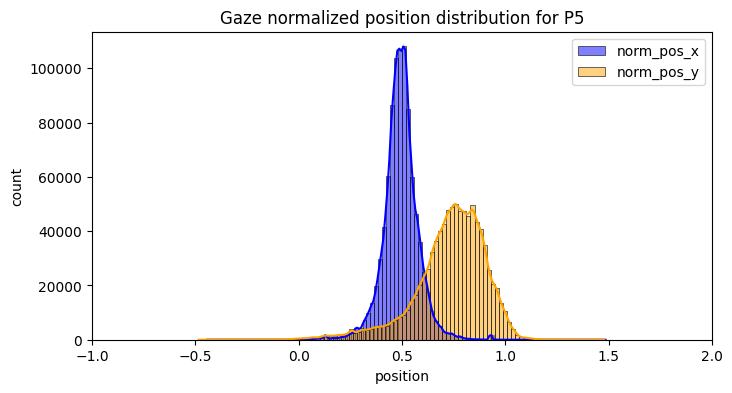

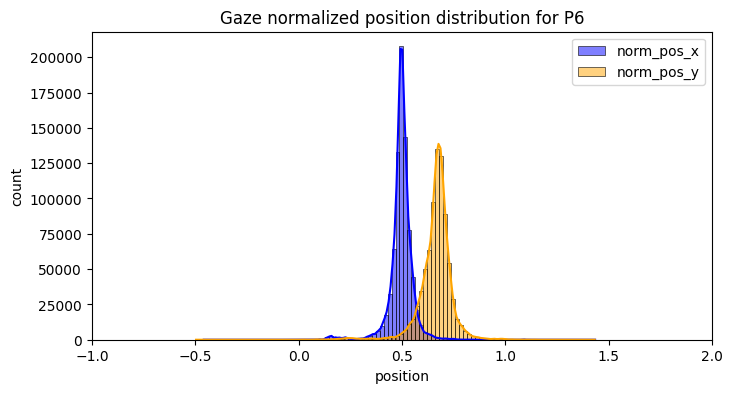

...

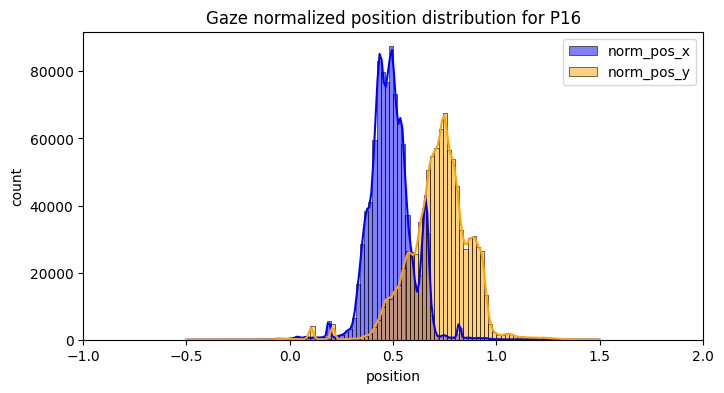

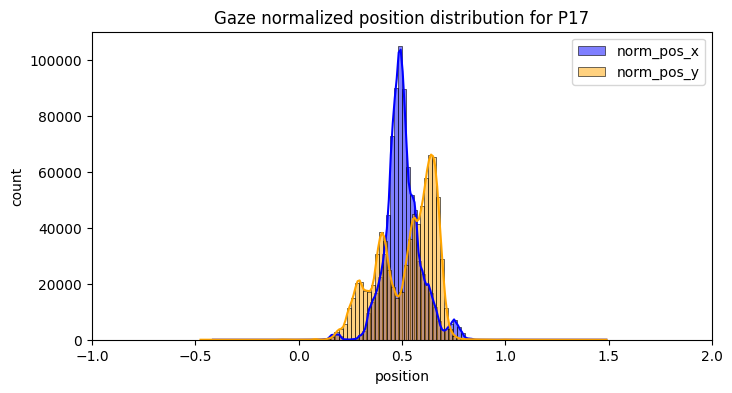

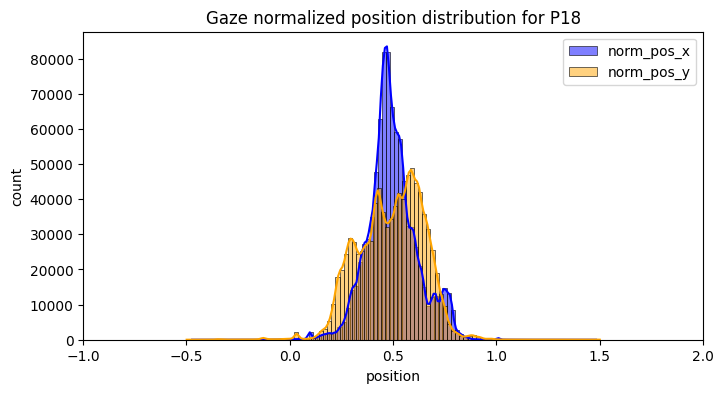

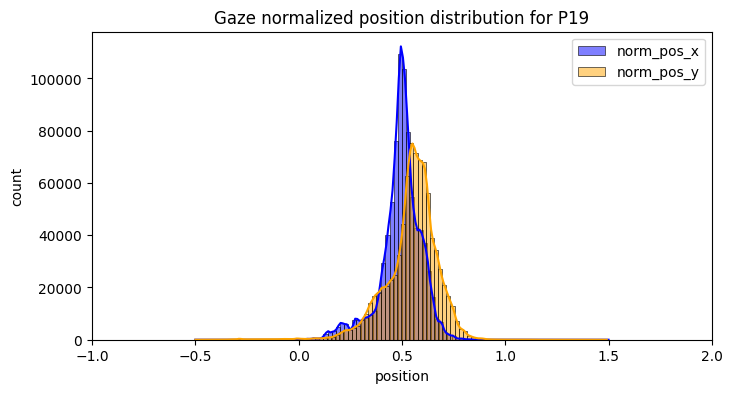

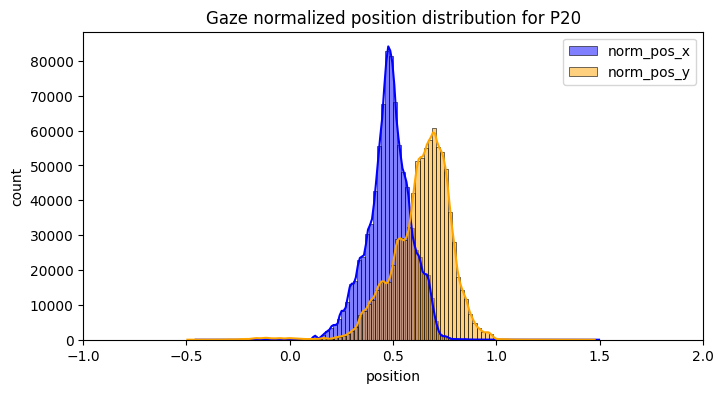

In [32]:
filtered_x = ddf[(ddf['norm_pos_x'] > -0.5) & (ddf['norm_pos_x'] < 1.5)][['participant_id', 'confidence', 'norm_pos_x']]
filtered_y = ddf[(ddf['norm_pos_y'] > -0.5) & (ddf['norm_pos_y'] < 1.5)][['participant_id', 'confidence', 'norm_pos_y']]
for pid in participant_ids:
    participant_x = filtered_x[filtered_x['participant_id'] == pid]['norm_pos_x']
    participant_y = filtered_y[filtered_y['participant_id'] == pid]['norm_pos_y']
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_x, bins=100, kde=True, color='blue', label='norm_pos_x')
    sns.histplot(participant_y, bins=100, kde=True, color='orange', label='norm_pos_y')
    plt.title(f'Gaze normalized position distribution for P{pid}')
    plt.xlabel('position')
    plt.ylabel('count')
    plt.xlim(-1, 2)
    plt.legend()
    plt.show()

##### Confidence-normalized position correlation
- Weird cut between 0.6 and 0.7 confidence
- Check algorithm

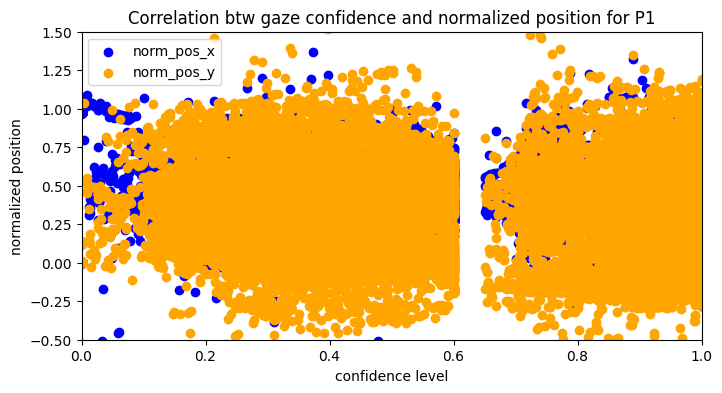

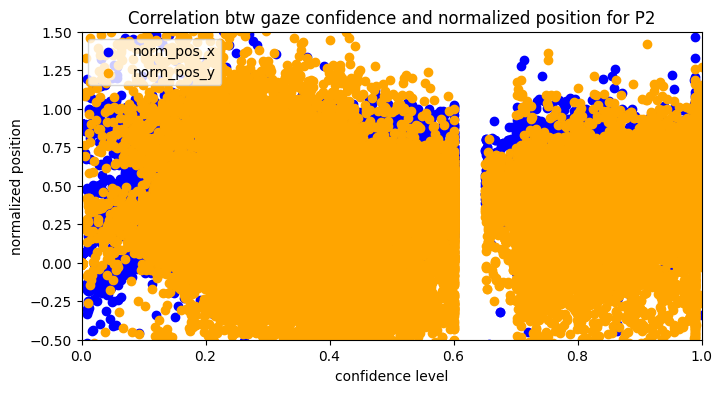

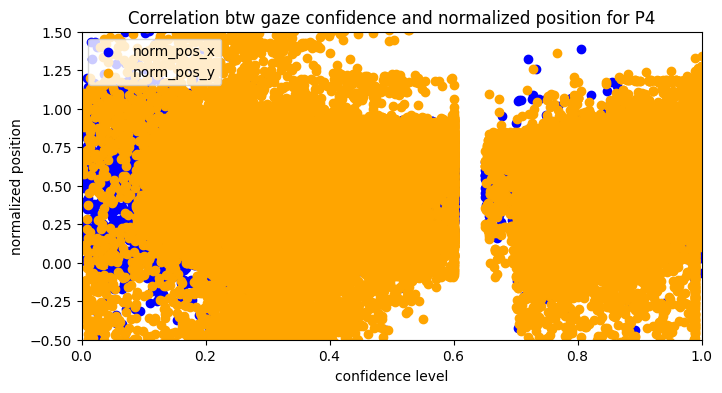

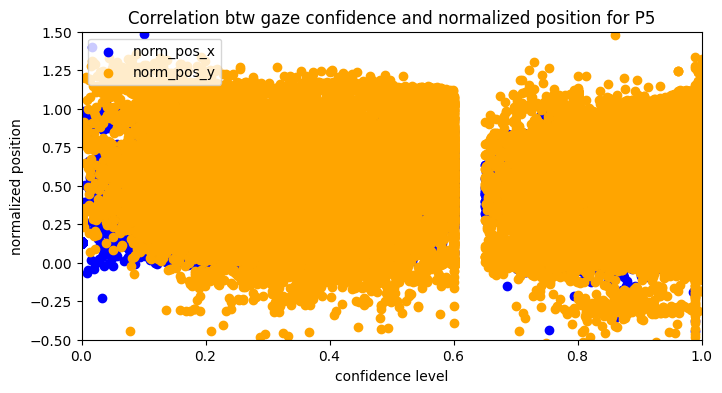

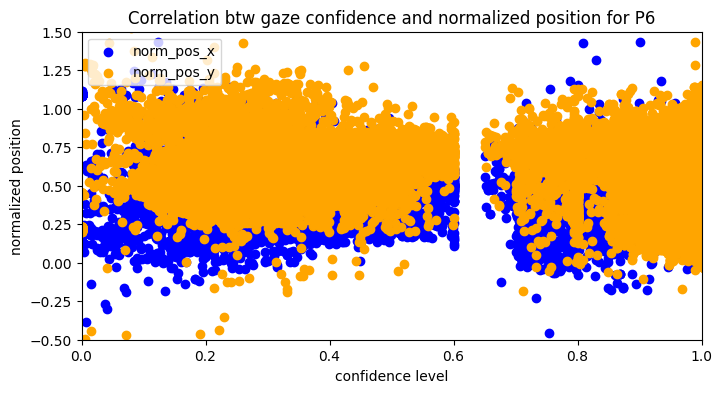

...

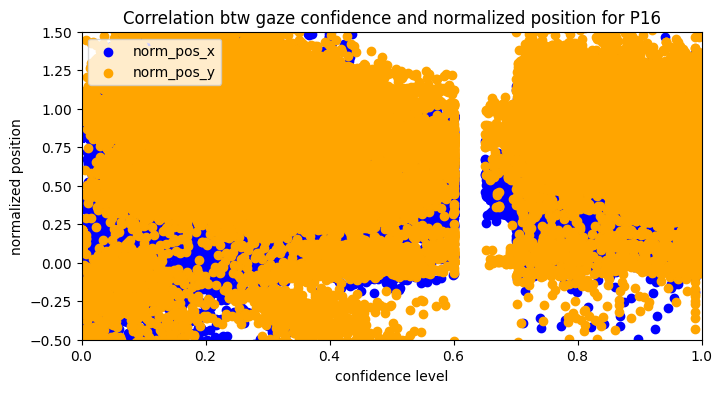

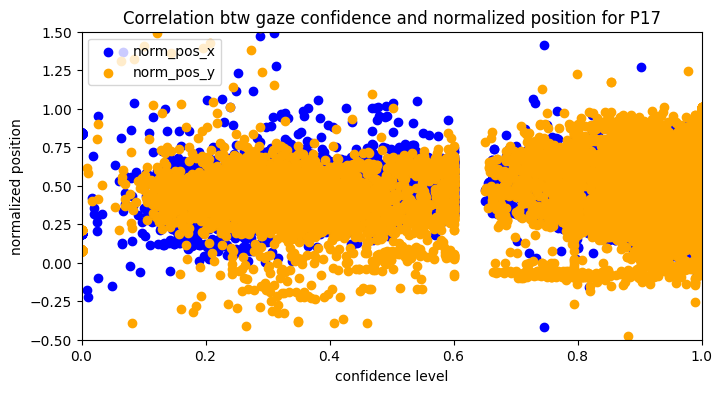

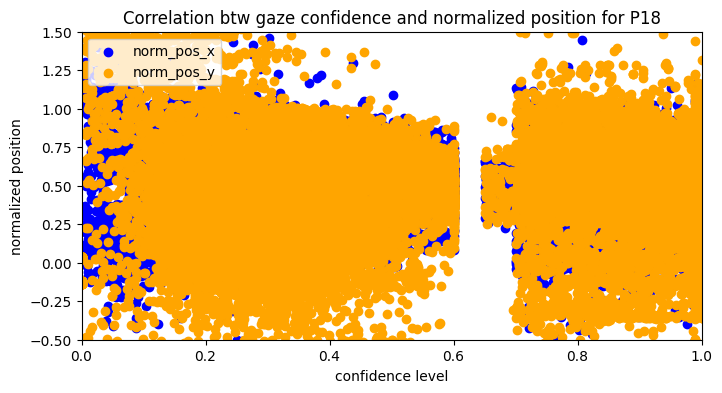

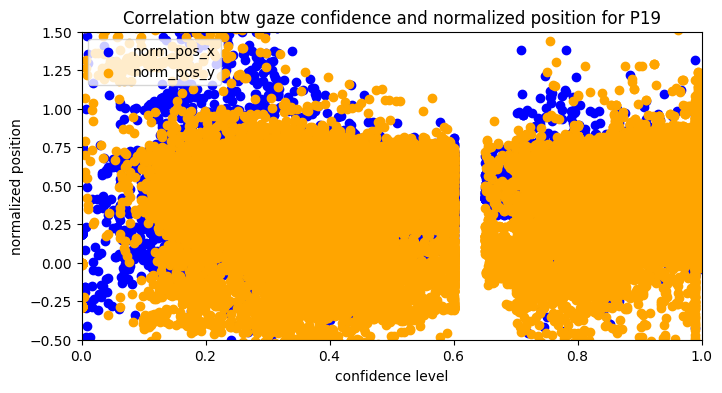

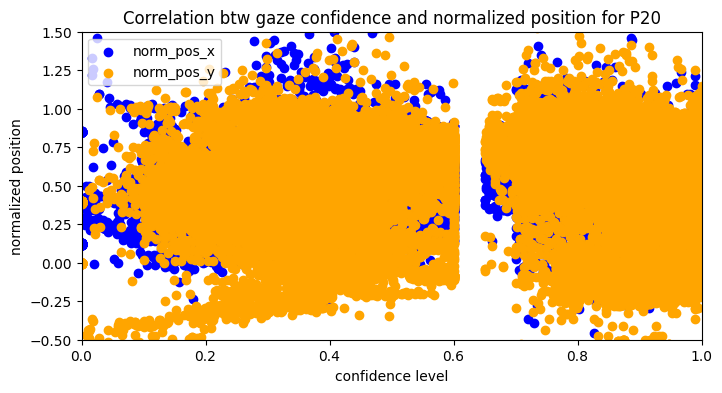

In [4]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['confidence'], participant_ddf['norm_pos_x'], color='blue', label='norm_pos_x')
    plt.scatter(participant_ddf['confidence'], participant_ddf['norm_pos_y'], color='orange', label='norm_pos_y')
    plt.title(f'Correlation btw gaze confidence and normalized position for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('normalized position')
    plt.xlim(0, 1)
    plt.ylim(-0.5, 1.5)
    plt.legend(loc='upper left')
    plt.show()

##### Normalized position boxplot
- Whisker are NOT outliers

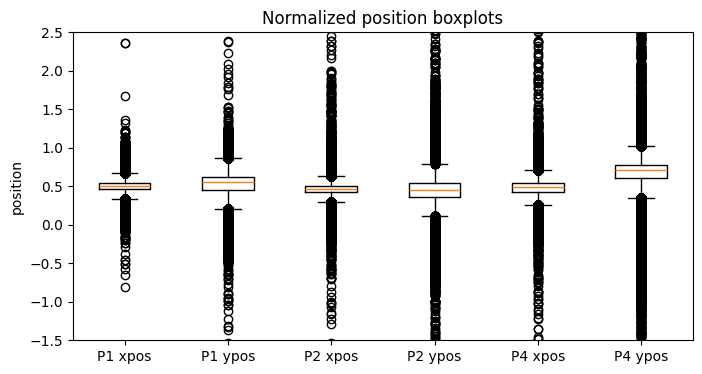

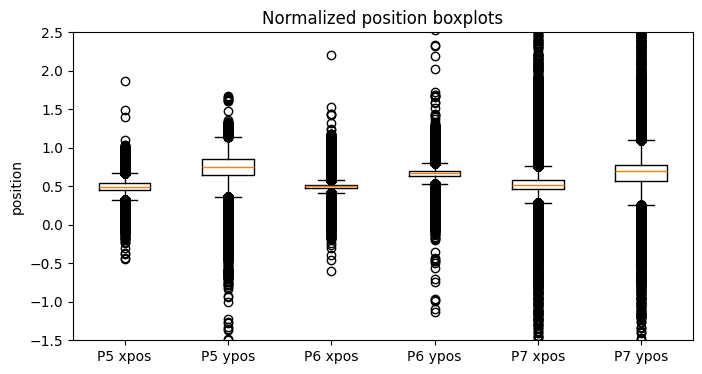

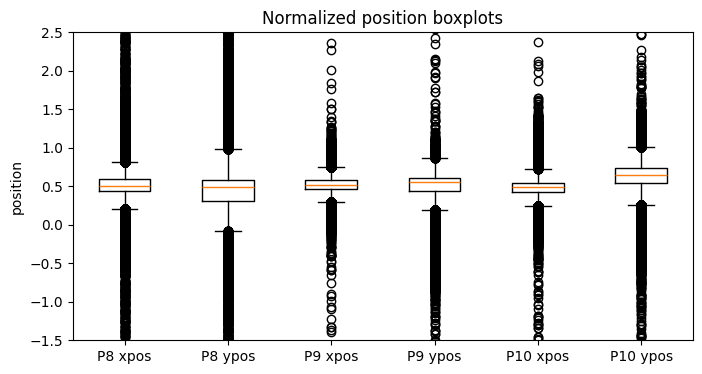

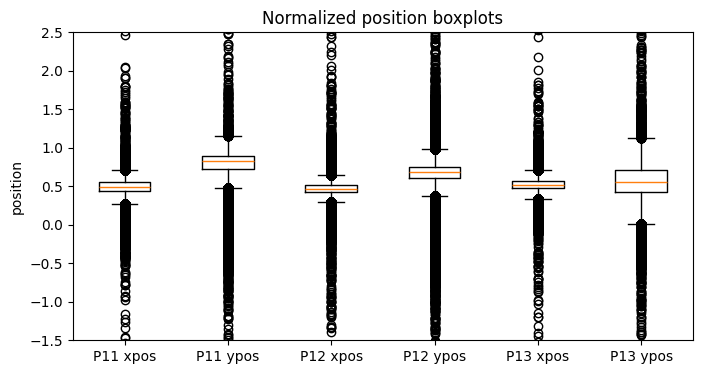

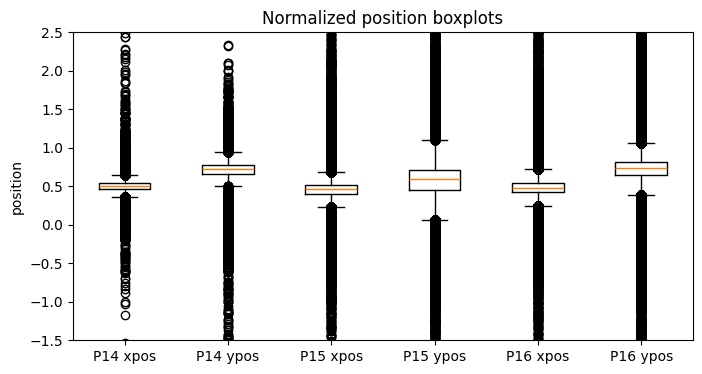

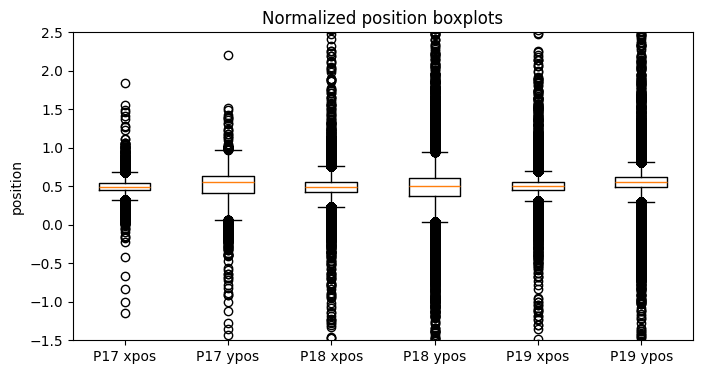

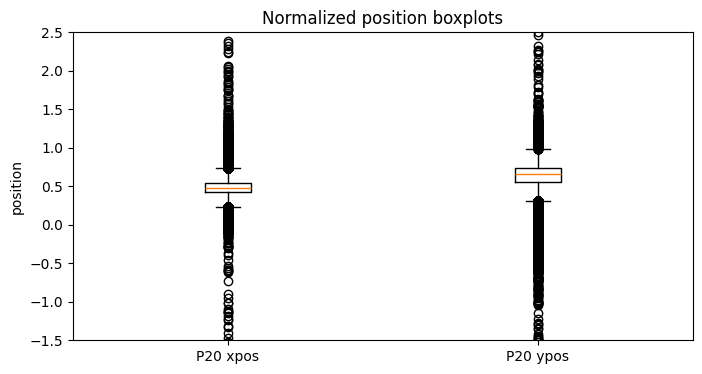

In [35]:
grouped_ids = [participant_ids[i:i+3] for i in range(0, len(participant_ids), 3)] #group ids
for group in grouped_ids: #iterate groups
    pos_ddf = []
    labels = []
    for pid in group:
        participant_ddf = ddf[ddf['participant_id'] == pid]
        x = participant_ddf['norm_pos_x']
        y = participant_ddf['norm_pos_y']
        pos_ddf.append(x)
        pos_ddf.append(y)
        labels.append(f'P{pid} xpos')
        labels.append(f'P{pid} ypos')
    plt.figure(figsize=(8, 4))
    plt.boxplot(pos_ddf, whis = 1.5)
    plt.title(f'Normalized position boxplots')
    plt.ylabel('position')
    plt.xticks(range(1, len(labels) + 1), labels)
    plt.ylim(-1.5, 2.5)
    plt.show()

##### Spatial distribution
- Good

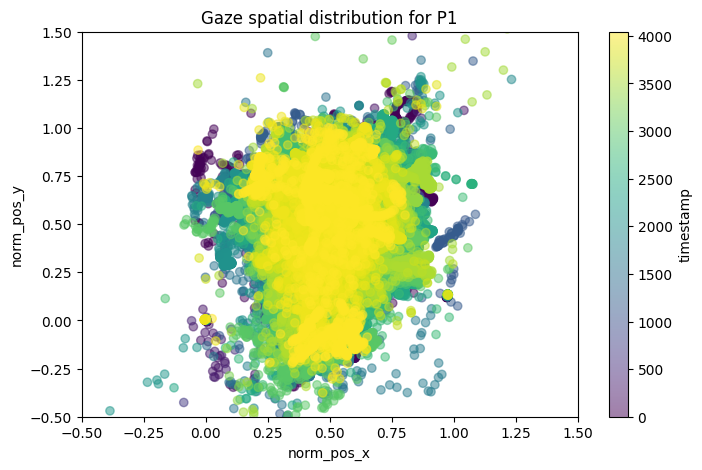

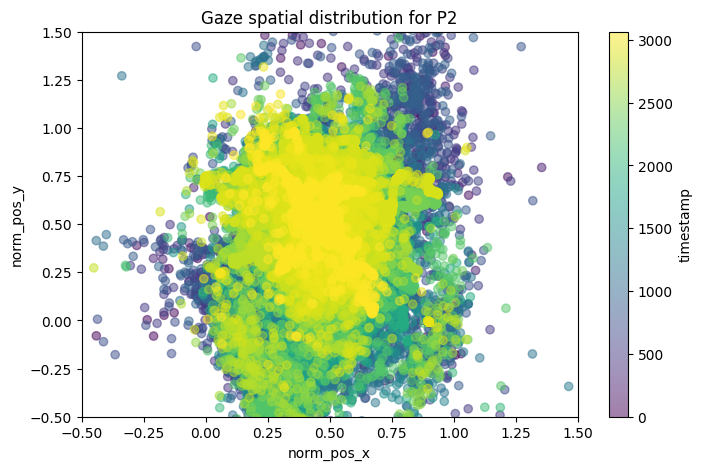

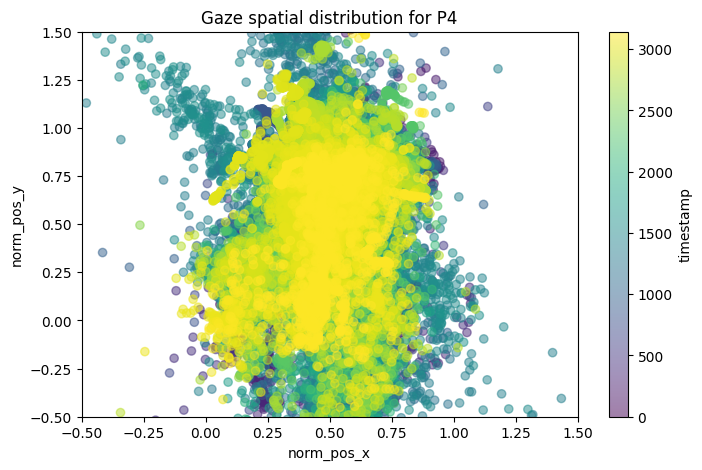

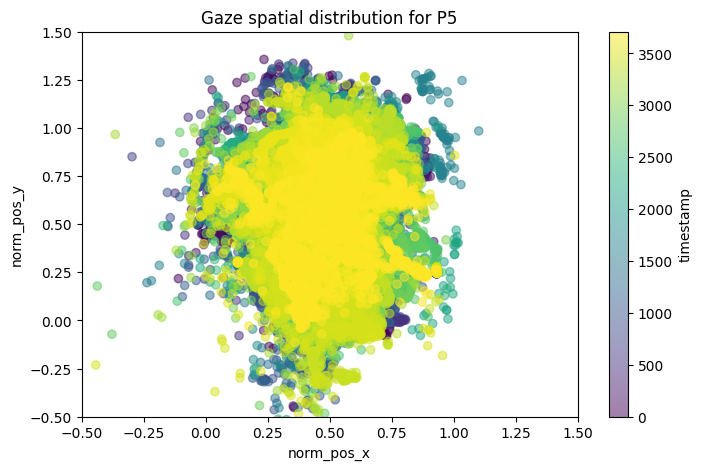

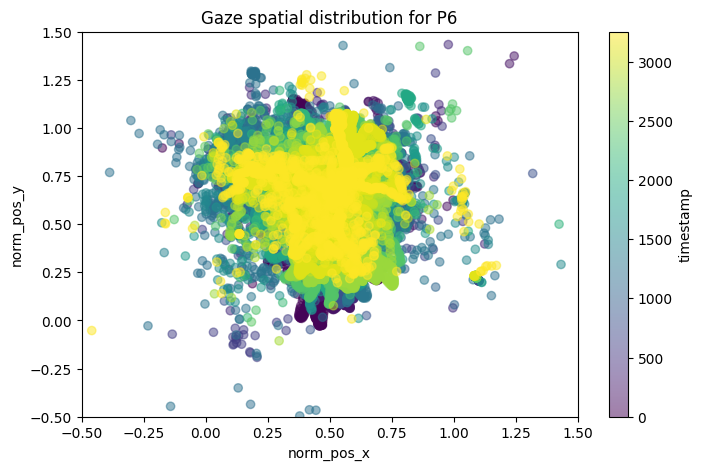

...

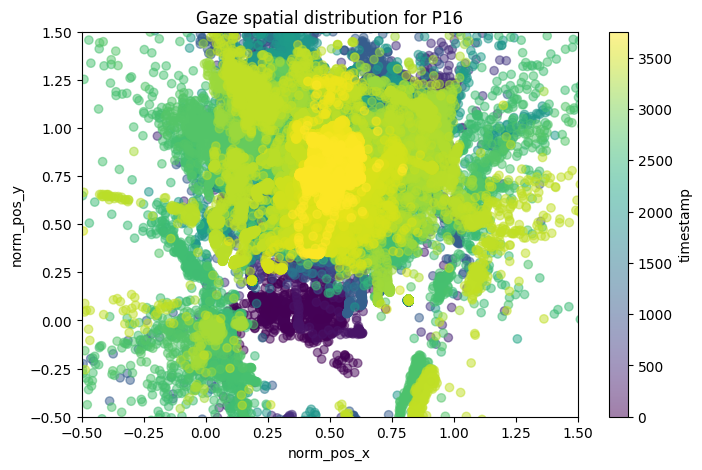

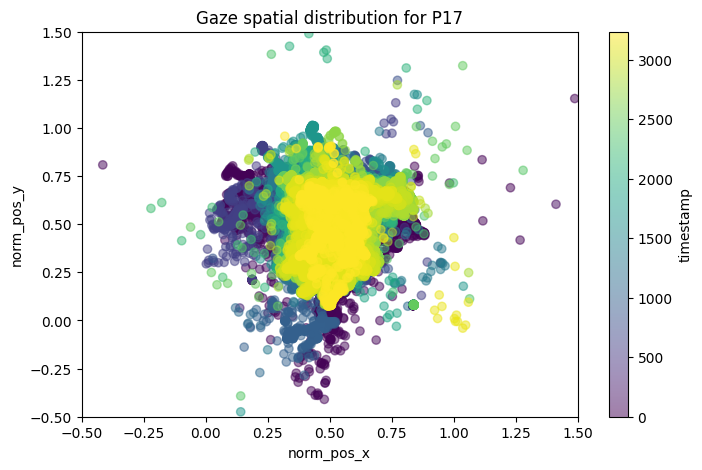

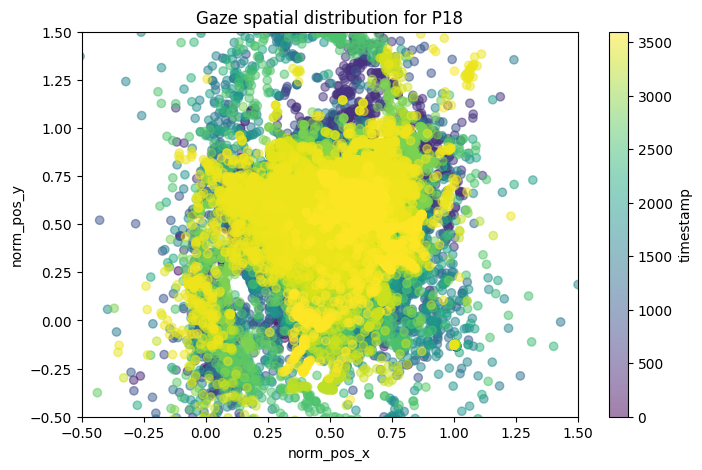

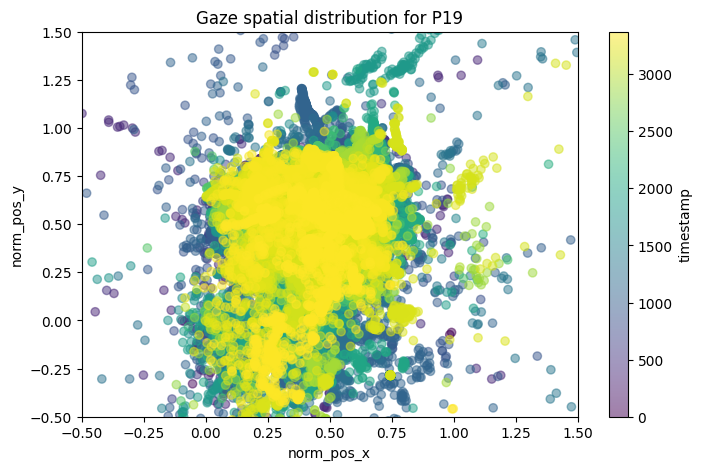

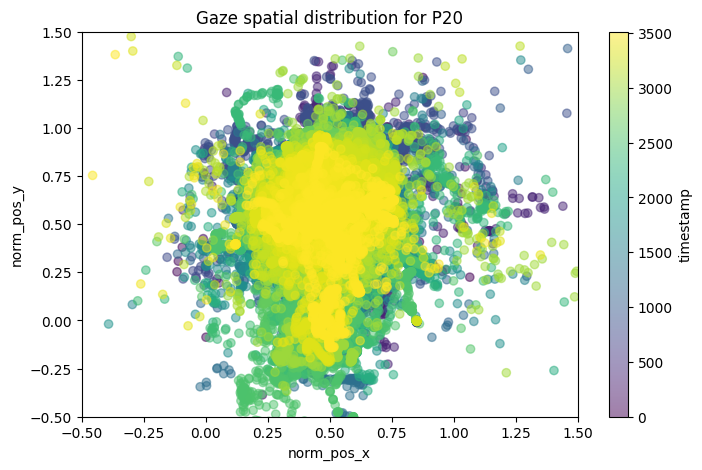

In [26]:
df['relative_timestamp'] = df.groupby('participant_id')['gaze_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(8, 5))
    plt.scatter(participant_df['norm_pos_x'], participant_df['norm_pos_y'], c=participant_df['relative_timestamp'], alpha = 0.5)
    plt.colorbar().ax.set_ylabel('timestamp')
    plt.title(f'Gaze spatial distribution for P{pid}')
    plt.xlabel('norm_pos_x')
    plt.ylabel('norm_pos_y')
    plt.xlim(-0.5, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.show()

### 3. Time-Series Assessment
Confidence, Normalized position

##### Confidence over time
- higher variance of confidence if compared to other parameters (ex. fixations)

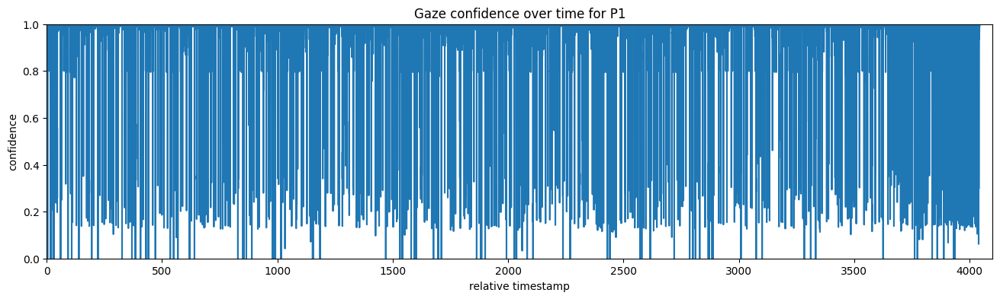

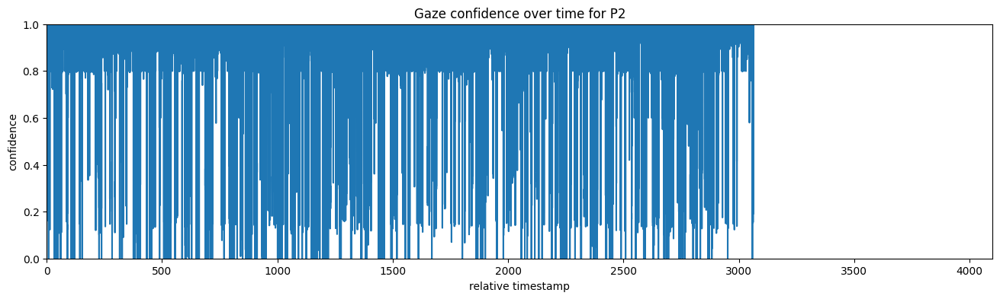

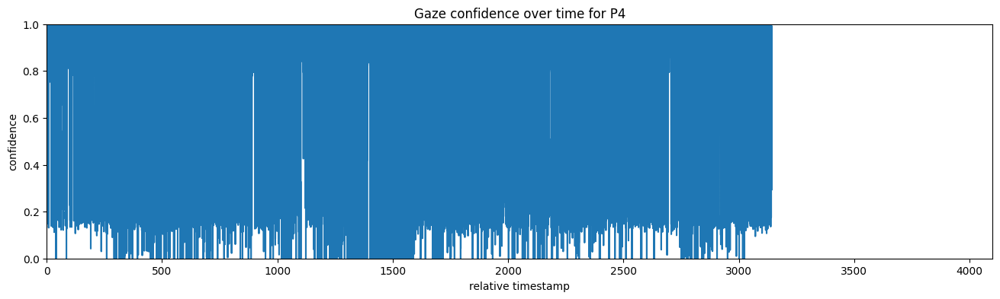

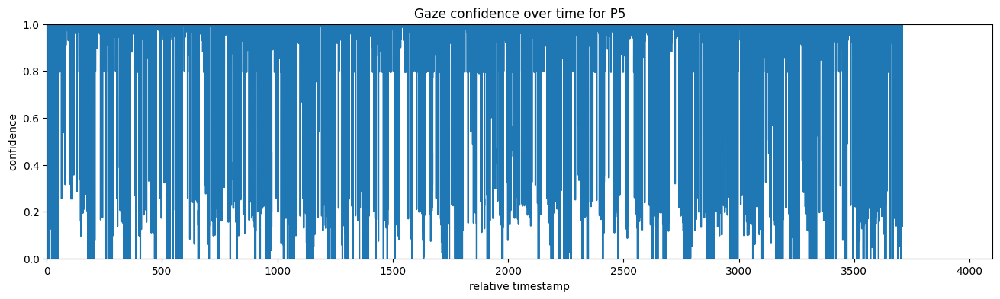

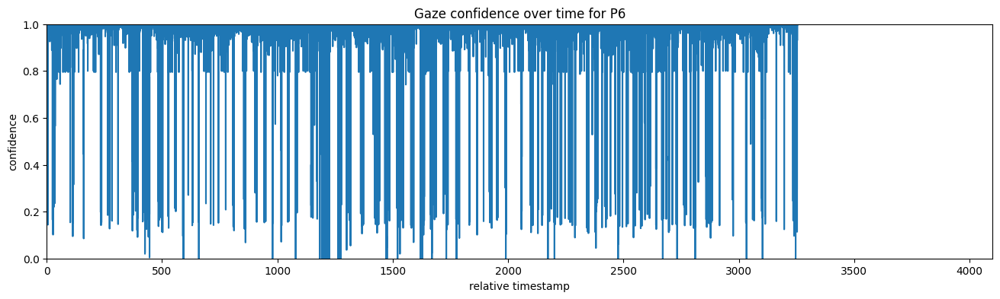

...

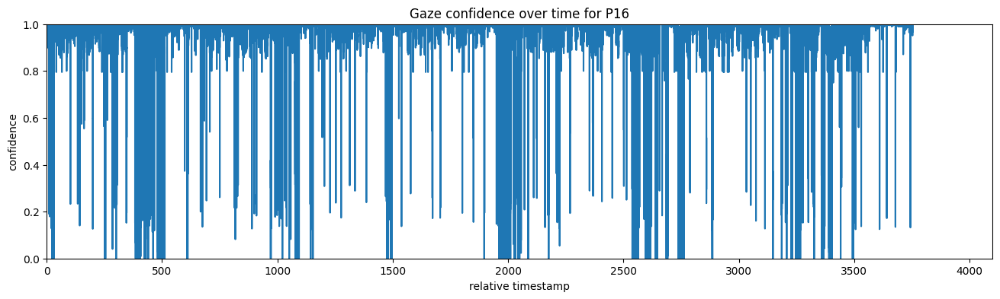

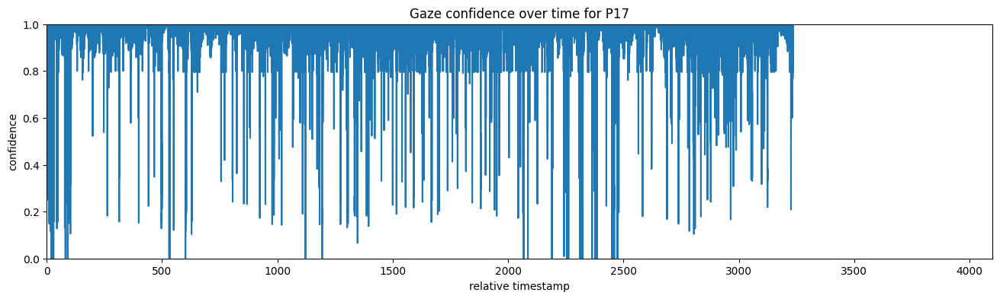

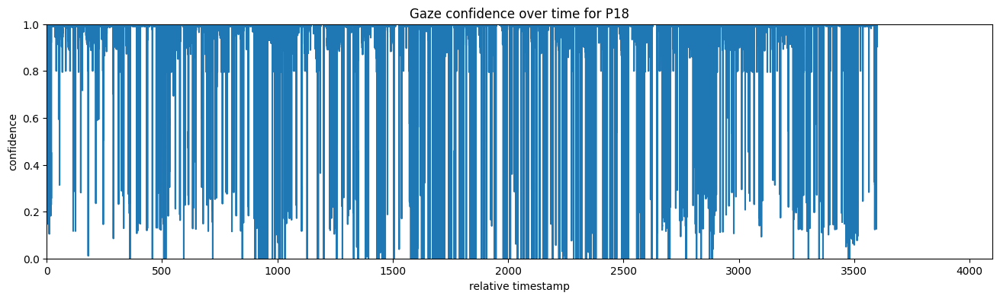

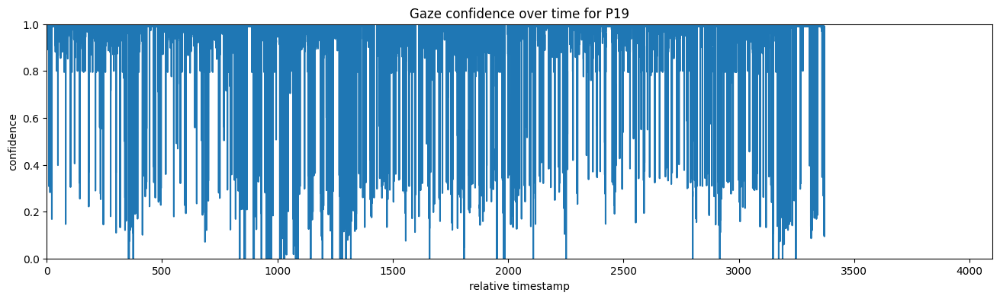

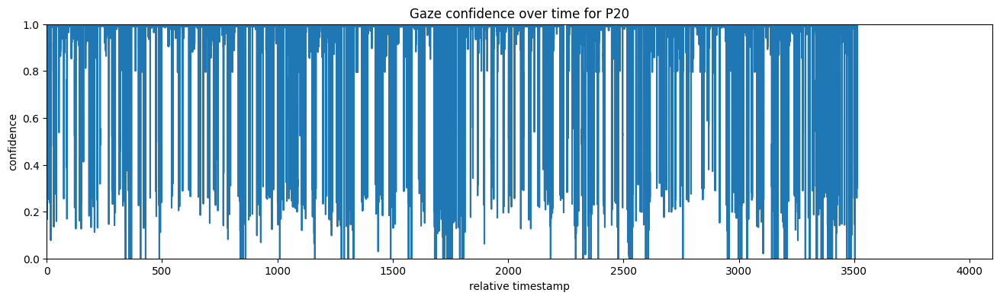

In [27]:
df['relative_timestamp'] = df.groupby('participant_id')['gaze_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['confidence'])
    plt.title(f'Gaze confidence over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('confidence')
    plt.xlim(0, 4100)
    plt.ylim(0, 1)
    plt.show()

##### Normalized position over time
- Period of wider movement (P4, P8, P9, P15)

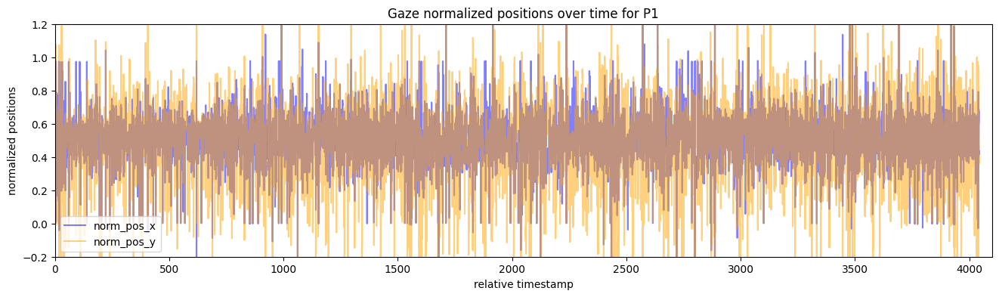

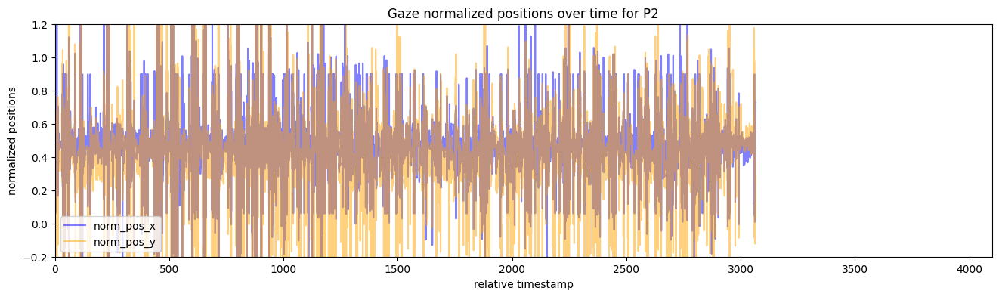

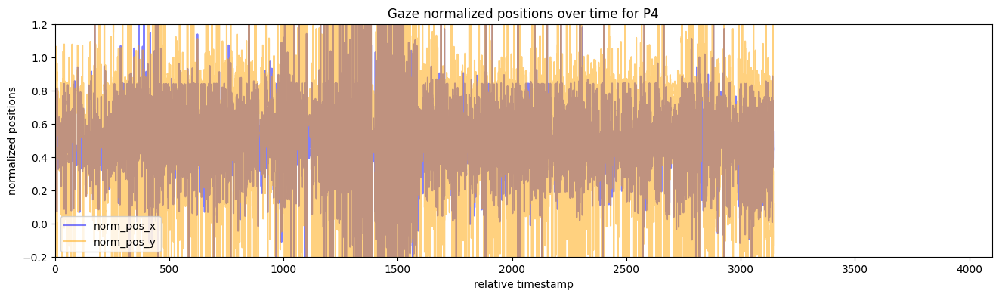

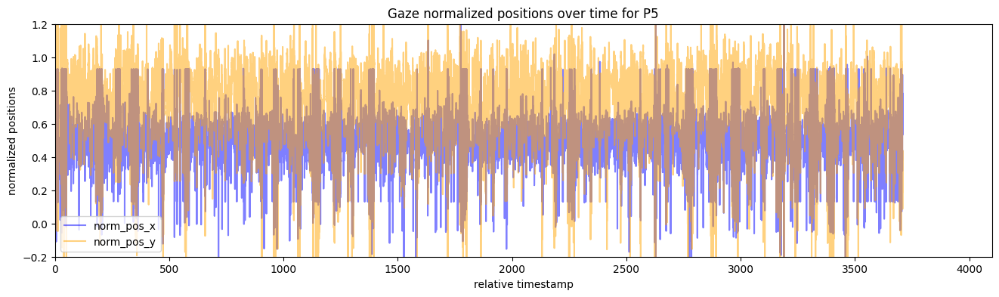

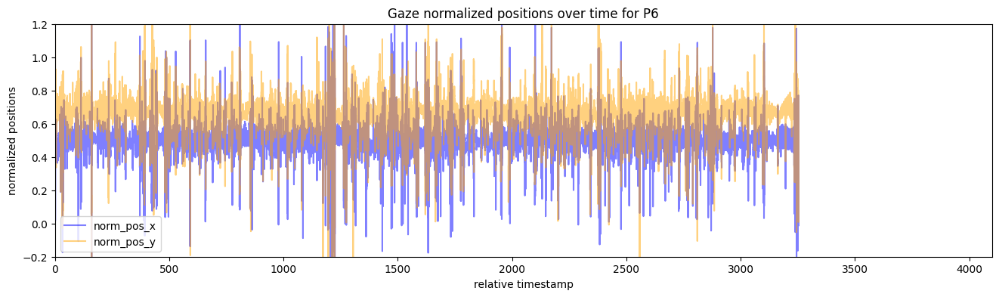

...

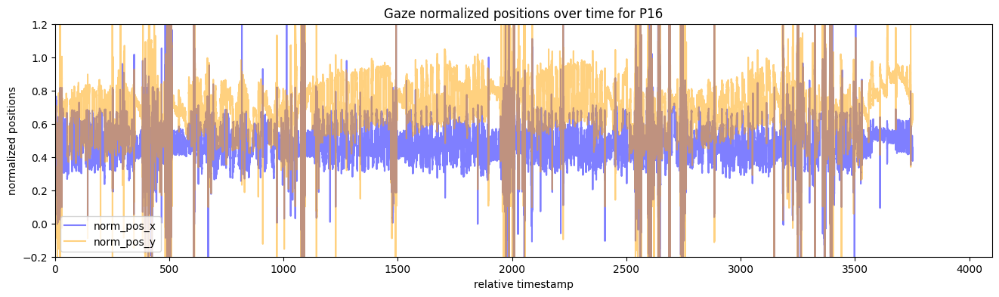

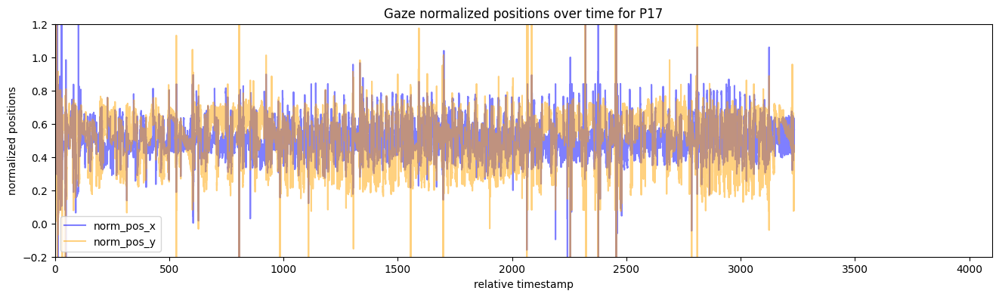

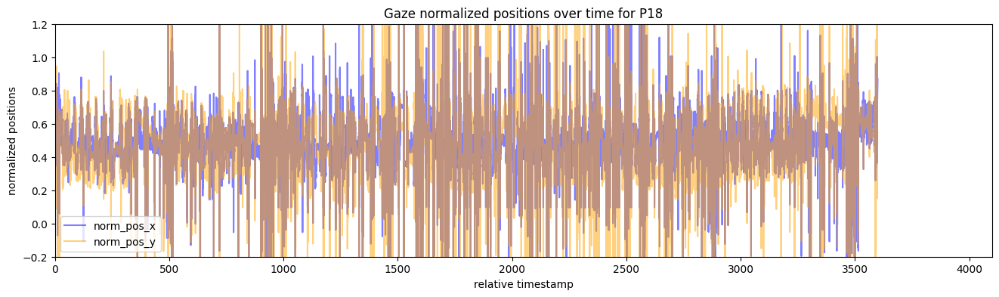

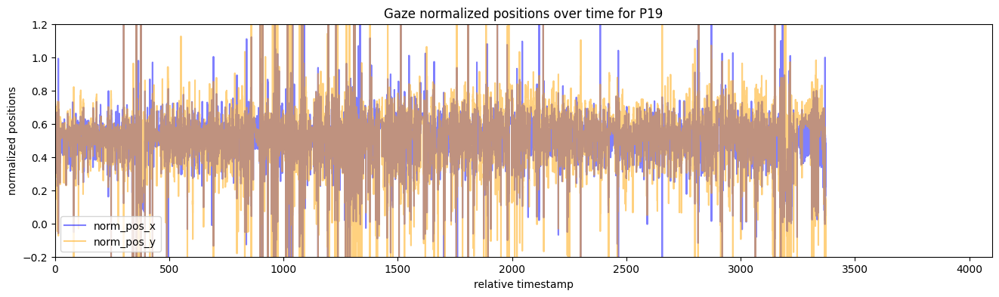

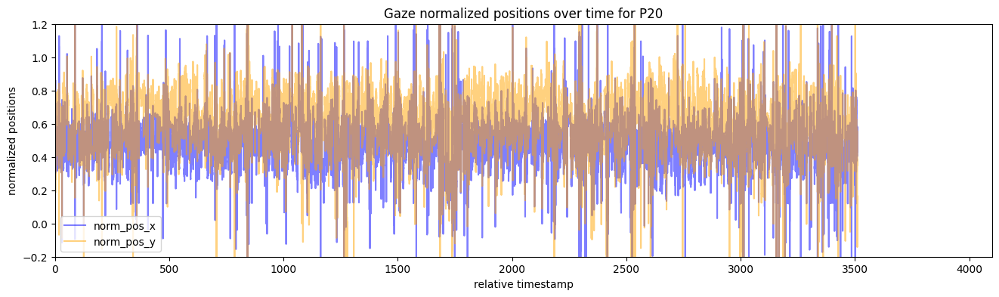

In [28]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['norm_pos_x'], alpha = 0.5, color='blue', label='norm_pos_x')
    plt.plot(participant_df['relative_timestamp'], participant_df['norm_pos_y'], alpha = 0.5, color='orange', label='norm_pos_y')
    plt.title(f'Gaze normalized positions over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('normalized positions')
    plt.xlim(0, 4100)
    plt.ylim(-0.2, 1.2)
    plt.legend(loc='lower left')
    plt.show()

### 4. Case-Specific Check-Ups
Confidence cut, Confidence

##### Confidence cut (0.6-0.65)
- SOLVED: Good
- Result of mean calculation from matching pupil confidences

STARTING FROM PUPIL CONFIDENCE CUT (0.6-0.7)  

--> Confidence is calculated as the mean of the confidence values of the matched pupil data points  (cut-off between .6 and .7)  
Due to averaging, the cut-off might be slightly changed (to .6-.65)

https://github.com/pupil-labs/pupil/blob/634d13a4536b7b8d52e8ec55639291b899036e48/pupil_src/shared_modules/gaze_mapping/gazer_2d.py#L192


In [17]:
ddf_cutoff2 = ddf[(ddf['confidence'] > .6) & (ddf['confidence'] < .65)]
len(ddf_cutoff2)

0

In [14]:
ddf_cutoff_low = ddf[(ddf['confidence'] >= .6) & (ddf['confidence'] <= .61)]['confidence'].max().compute()
ddf_cutoff_low

0.6

In [19]:
ddf_cutoff_up = ddf[(ddf['confidence'] > .6) & (ddf['confidence'] <= .66)]['confidence'].min().compute()
ddf_cutoff_up

0.6500075042247773

In [21]:
lower_cutoffs = []
upper_cutoffs = []

for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    lower = participant_ddf[(participant_ddf['confidence'] >= .55) & (participant_ddf['confidence'] < .61)]['confidence'].max().compute()
    upper = participant_ddf[(participant_ddf['confidence'] >= .65) & (participant_ddf['confidence'] < .71)]['confidence'].min().compute()
    lower_cutoffs.append(lower)
    upper_cutoffs.append(upper)

cutoffs_df = display_df = pd.DataFrame({
    'participant_id': participant_ids,
    'lower_cutoff': lower_cutoffs,
    'upper_cutoff': upper_cutoffs
})

In [22]:
cutoffs_df

,participant_id,lower_cutoff,upper_cutoff
0,1,0.6,0.650328
1,2,0.6,0.650067
2,4,0.6,0.650613
3,5,0.6,0.650112
4,6,0.6,0.651387
5,7,0.6,0.650016
6,8,0.6,0.650008
7,9,0.6,0.650054
8,10,0.6,0.650083
9,11,0.6,0.650512


In [8]:
print([len(critical_ddf[critical_ddf['participant_id'] == pid]) for pid in participant_ids])

[133, 412, 304, 458, 53, 709, 5486, 209, 221, 136, 262, 182, 308, 966, 281, 102, 120, 567, 284]


In [4]:
critical_ddf = ddf[(ddf['confidence'] >= .65) & (ddf['confidence'] < .7)]
critical_df = critical_ddf.compute()

In [102]:
len(critical_df)

11193

In [5]:
columns = ['participant_id', 'pupil_timestamp', 'eye_id', 'confidence', 'diameter_3d']
pp_ddf = data['all_pupil_positions'].loc[:, columns]
pp_df = pp_ddf.compute()

In [145]:
result_columns = ['participant_id', 'gaze_timestamp', 'gaze_confidence', 'pupil_confidence0', 'pupil_confidence1', 'gaze_base_data']
results = []

# Loop through each row in critical_df
for idx, case in critical_df.iterrows():
    critical_pid = case['participant_id']
    critical_timestamp = case['gaze_timestamp']
    critical_confidence = case['confidence']
    critical_base_data = case['base_data']

    # Extract and convert pupil timestamps
    pp_critical_timestamps = [float(element[0:-2]) for element in critical_base_data.split()]

    # Find matching pupil data
    pp_case = pp_df[(pp_df['pupil_timestamp'] >= pp_critical_timestamps[0]-.000001) & (pp_df['pupil_timestamp'] <= pp_critical_timestamps[0]+.000001) | 
                    (pp_df['pupil_timestamp'] >= pp_critical_timestamps[1]-.000001) & (pp_df['pupil_timestamp'] <= pp_critical_timestamps[1]+.000001)]

    # Extract pupil confidences
    if len(pp_case) == 0:
        pupil_confidence0 = None
        pupil_confidence1 = None
    elif len(pp_case) == 1:
        pupil_confidence0 = pp_case['confidence'].iloc[0]
        pupil_confidence1 = None
    else:
        pupil_confidence0 = pp_case[pp_case['eye_id']==0]['confidence'].max()
        pupil_confidence1 = pp_case[pp_case['eye_id']==1]['confidence'].max()

    # Append the result
    results.append([critical_pid, critical_timestamp, critical_confidence, pupil_confidence0, pupil_confidence1, critical_base_data])

In [146]:
result_df = pd.DataFrame(results, columns=result_columns)

In [147]:
result_df['mean_pupil_confidence'] = result_df[['pupil_confidence0', 'pupil_confidence1']].mean(axis=1)
result_df['confidence_difference'] = result_df['gaze_confidence'] - result_df['mean_pupil_confidence']

In [148]:
result_df

,participant_id,gaze_timestamp,gaze_confidence,pupil_confidence0,pupil_confidence1,gaze_base_data,mean_pupil_confidence,confidence_difference
0,1,-672714.148951,0.681413,0.762826,0.600000,-672714.149023-0 -672714.148879-1,0.681413,0.000000
1,1,-672667.009068,0.684439,0.600000,0.768878,-672667.009067-0 -672667.009068-1,0.684439,0.000000
2,1,-672647.749767,0.695671,0.791341,0.642877,-672647.754693-0 -672647.7448410001-1,0.717109,-0.021439
3,1,-672593.516770,0.677746,0.636174,0.755491,-672593.517018-0 -672593.516523-1,0.695833,-0.018087
4,1,-672566.460989,0.690950,0.600000,0.781899,-672566.468992-0 -672566.452987-1,0.690950,0.000000
...,...,...,...,...,...,...,...,...
11188,20,83871.514014,0.696649,0.600000,0.793297,83871.511982-0 83871.516046-1,0.696649,0.000000
11189,20,83896.518038,0.657855,0.600000,0.715709,83896.520042-0 83896.516034-1,0.657855,0.000000
11190,20,83985.682024,0.667010,0.634650,0.734020,83985.679992-0 83985.684055-1,0.684335,-0.017325
11191,20,83985.702027,0.668559,0.737118,0.600000,83985.704037-0 83985.700018-1,0.668559,0.000000


In [149]:
anomalies = result_df[result_df['confidence_difference'] != 0]
anomalies

,participant_id,gaze_timestamp,gaze_confidence,pupil_confidence0,pupil_confidence1,gaze_base_data,mean_pupil_confidence,confidence_difference
2,1,-672647.749767,0.695671,0.791341,0.642877,-672647.754693-0 -672647.7448410001-1,0.717109,-0.021439
3,1,-672593.516770,0.677746,0.636174,0.755491,-672593.517018-0 -672593.516523-1,0.695833,-0.018087
5,1,-672489.036927,0.697867,0.795733,0.682695,-672489.0409660001-0 -672489.032887-1,0.739214,-0.041347
6,1,-672430.368978,0.684046,0.620003,0.768091,-672430.36898-0 -672430.368975-1,0.694047,-0.010001
9,1,-672274.296907,0.692874,0.621345,0.785748,-672274.296927-0 -672274.296886-1,0.703547,-0.010672
...,...,...,...,...,...,...,...,...
11177,20,83643.493993,0.658930,0.717860,0.627867,83643.495959-0 83643.492026-1,0.672863,-0.013933
11178,20,83643.497958,0.658930,0.717860,0.638769,83643.495959-0 83643.499956-1,0.678315,-0.019385
11179,20,83643.501956,0.660699,0.721399,0.638769,83643.503956-0 83643.499956-1,0.680084,-0.019385
11180,20,83643.553979,0.670644,0.741287,0.696513,83643.55997-0 83643.547987-1,0.718900,-0.048256


In [153]:
# An eye ==.6 and the other one <.7
result_df[(result_df['pupil_confidence0'] == .6) & (result_df['pupil_confidence1'] < .7) | (result_df['pupil_confidence0'] < .7) & (result_df['pupil_confidence1'] == .6)]

,participant_id,gaze_timestamp,gaze_confidence,pupil_confidence0,pupil_confidence1,gaze_base_data,mean_pupil_confidence,confidence_difference


!!! pupil_confidence is always >.6 for gaze_confidence between  .65 and .7  

BUT there shouldn't be any pupil confidence between .6 and .7